# ECSE 415 - Assignment 2: Image Matching and Face Detection


Mathieu-Joseph Magri, 260928498

In [84]:
#Import Statements
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from skimage.feature import hog
import os
import random
import pickle
import scipy as sp



#Google Drive Mount
from google.colab import drive
drive.mount('/content/drive')

#Path Variable for images
path = '/content/drive/MyDrive/ECSE_415/Assignments/A2/Assignment2_Data/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Question 1: Image Classification using HoG (10 Points)


Question 1.1 Build a classifier using training images

Part 1.1.1: Resize the training images to 128x128

Original Images


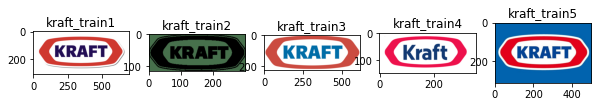

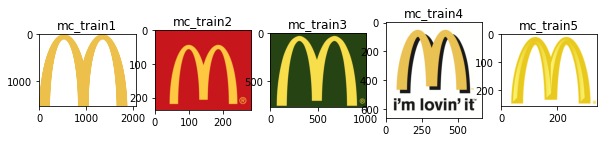

128x128 Images


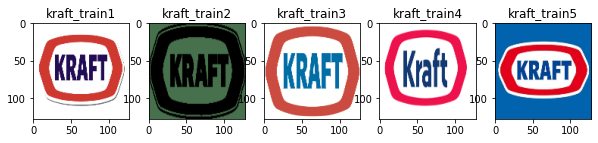

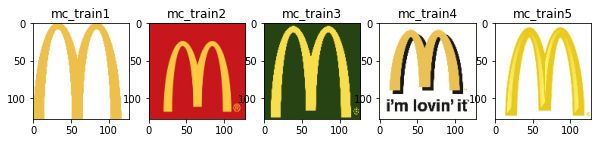

In [85]:
#Let's resize the training images to 128x128

#imageMessi = cv2.cvtColor(imageMessi, cv2.COLOR_BGR2RGB)

#First we import all training images
kTrain1 = cv2.imread(path+'Q1/training/kraft_train1.jpeg') #BGR image
kTrain1 = cv2.cvtColor(kTrain1, cv2.COLOR_BGR2RGB)

kTrain2 = cv2.imread(path+'Q1/training/kraft_train2.jpeg') #BGR image
kTrain2 = cv2.cvtColor(kTrain2, cv2.COLOR_BGR2RGB)

kTrain3 = cv2.imread(path+'Q1/training/kraft_train3.jpeg') #BGR image
kTrain3 = cv2.cvtColor(kTrain3, cv2.COLOR_BGR2RGB)

kTrain4 = cv2.imread(path+'Q1/training/kraft_train4.jpeg') #BGR image
kTrain4 = cv2.cvtColor(kTrain4, cv2.COLOR_BGR2RGB)

kTrain5 = cv2.imread(path+'Q1/training/kraft_train5.jpeg') #BGR image
kTrain5 = cv2.cvtColor(kTrain5, cv2.COLOR_BGR2RGB)

McTrain1 = cv2.imread(path+'Q1/training/mc_train1.jpeg') #BGR image
McTrain1 = cv2.cvtColor(McTrain1, cv2.COLOR_BGR2RGB)

McTrain2 = cv2.imread(path+'Q1/training/mc_train2.jpeg') #BGR image
McTrain2 = cv2.cvtColor(McTrain2, cv2.COLOR_BGR2RGB)

McTrain3 = cv2.imread(path+'Q1/training/mc_train3.jpeg') #BGR image
McTrain3 = cv2.cvtColor(McTrain3, cv2.COLOR_BGR2RGB)

McTrain4 = cv2.imread(path+'Q1/training/mc_train4.jpeg') #BGR image
McTrain4 = cv2.cvtColor(McTrain4, cv2.COLOR_BGR2RGB)

McTrain5 = cv2.imread(path+'Q1/training/mc_train5.jpeg') #BGR image
McTrain5 = cv2.cvtColor(McTrain5, cv2.COLOR_BGR2RGB)

#We will plot all images before the 128x128 transformation

print("Original Images")

plt.figure(figsize=(10, 10))

plt.subplot(151), plt.imshow(kTrain1)
plt.title("kraft_train1")
#plt.xticks([]), plt.yticks([]) Removes x/y coords

plt.subplot(152), plt.imshow(kTrain2)
plt.title("kraft_train2")

plt.subplot(153), plt.imshow(kTrain3)
plt.title("kraft_train3")

plt.subplot(154), plt.imshow(kTrain4)
plt.title("kraft_train4")

plt.subplot(155), plt.imshow(kTrain5)
plt.title("kraft_train5")

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(151), plt.imshow(McTrain1)
plt.title("mc_train1")

plt.subplot(152), plt.imshow(McTrain2)
plt.title("mc_train2")

plt.subplot(153), plt.imshow(McTrain3)
plt.title("mc_train3")

plt.subplot(154), plt.imshow(McTrain4)
plt.title("mc_train4")

plt.subplot(155), plt.imshow(McTrain5)
plt.title("mc_train5")

plt.show()

#Now we will resize the images

#Kraft
kTrain1 = cv2.resize(kTrain1, (128,128))
kTrain2 = cv2.resize(kTrain2, (128,128))
kTrain3 = cv2.resize(kTrain3, (128,128))
kTrain4 = cv2.resize(kTrain4, (128,128))
kTrain5 = cv2.resize(kTrain5, (128,128))

#McDonald's
McTrain1 = cv2.resize(McTrain1, (128,128))
McTrain2 = cv2.resize(McTrain2, (128,128))
McTrain3 = cv2.resize(McTrain3, (128,128))
McTrain4 = cv2.resize(McTrain4, (128,128))
McTrain5 = cv2.resize(McTrain5, (128,128))

#Plot of the resized images
print("128x128 Images")

plt.figure(figsize=(10, 10))

plt.subplot(151), plt.imshow(kTrain1)
plt.title("kraft_train1")
#plt.xticks([]), plt.yticks([]) Removes x/y coords

plt.subplot(152), plt.imshow(kTrain2)
plt.title("kraft_train2")

plt.subplot(153), plt.imshow(kTrain3)
plt.title("kraft_train3")

plt.subplot(154), plt.imshow(kTrain4)
plt.title("kraft_train4")

plt.subplot(155), plt.imshow(kTrain5)
plt.title("kraft_train5")

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(151), plt.imshow(McTrain1)
plt.title("mc_train1")

plt.subplot(152), plt.imshow(McTrain2)
plt.title("mc_train2")

plt.subplot(153), plt.imshow(McTrain3)
plt.title("mc_train3")

plt.subplot(154), plt.imshow(McTrain4)
plt.title("mc_train4")

plt.subplot(155), plt.imshow(McTrain5)
plt.title("mc_train5")

plt.show()

Part 1.1.2 and 1.1.3: Compute HoG features of size (32, 32, 8) for all training images and Apply blocknorm in 4x4 cell neighborhoods

In [86]:
#To compute the HoG features, we will use Tutorial 6 as well as the following link as a basis for our answer: https://medium.com/@dnemutlu/hog-feature-descriptor-263313c3b40d
#Finally, I also used the following repo as basis for some of the answers in question 1 as well: https://github.com/mattesko

#We will create a function that computes HoG Features of size (32, 32, 8)
#Values are given as pixels, height by withd
def computeHoGFeatures(img, imageSize=(128, 128), cell_size=(4, 4), block_size=(4, 4), nbins=8):
  
  #Convert image to grayscale
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
 
  # create HoG Object
  # winSize is the size of the image cropped to multiple of the cell size
  hog = cv2.HOGDescriptor(_winSize=(imageSize[1] // cell_size[1] * cell_size[1],
                                   imageSize[0] // cell_size[0] * cell_size[0]),
                         _blockSize=(block_size[1] * cell_size[1],
                                     block_size[0] * cell_size[0]),
                         _blockStride=(cell_size[1], cell_size[0]),
                          _cellSize=(cell_size[1], cell_size[0]),
                          _nbins=nbins)
  
  #Compute the HoG Descriptor for the gray scale image
  hog_descriptor = hog.compute(img)
  n_cells = (img.shape[0] // cell_size[0], img.shape[1] // cell_size[1])
  hog_descriptor =  hog.compute(img)\
                       .reshape(n_cells[1] - block_size[1] + 1,
                            n_cells[0] - block_size[0] + 1,
                            block_size[0], block_size[1], nbins) \
                       .transpose((1, 0, 2, 3, 4))

  #Define BlockNorm
  gradients = np.full((n_cells[0], n_cells[1], nbins), 0, dtype=float)    
  cell_count = np.full((n_cells[0], n_cells[1], 1), 0, dtype=int)

  for off_y in range(block_size[0]):
        for off_x in range(block_size[1]):
            gradients[off_y:n_cells[0] - block_size[0] + off_y + 1,
                      off_x:n_cells[1] - block_size[1] + off_x + 1] += \
                hog_descriptor[:, :, off_y, off_x, :]
            cell_count[off_y:n_cells[0] - block_size[0] + off_y + 1,
                       off_x:n_cells[1] - block_size[1] + off_x + 1] += 1

  # Normalize gradients
  gradients /= cell_count

  return hog_descriptor

#Computation of all the HoG features of the training images
kTrain1_features = computeHoGFeatures(kTrain1)
kTrain2_features = computeHoGFeatures(kTrain2)
kTrain3_features = computeHoGFeatures(kTrain3)
kTrain4_features = computeHoGFeatures(kTrain4)
kTrain5_features = computeHoGFeatures(kTrain5)

McTrain1_features = computeHoGFeatures(McTrain1)
McTrain2_features = computeHoGFeatures(McTrain2)
McTrain3_features = computeHoGFeatures(McTrain3)
McTrain4_features = computeHoGFeatures(McTrain4)
McTrain5_features = computeHoGFeatures(McTrain5)

#Debugging purposes
#print(McTrain5_features)


Part 1.1.4: Fit a nearest neighbor classifier with three neighbors.

In [87]:
#Set up labels manually for the training data
labels_Train = ['Kraft', 'Kraft', 'Kraft', 'Kraft', 'Kraft', 'McDonalds', 'McDonalds', 'McDonalds', 'McDonalds', 'McDonalds']
labels_Train = np.asarray(labels_Train)

#Create an array for the HoG features of the training data
HoGFeatures_Train = [kTrain1_features, kTrain2_features, kTrain3_features, kTrain4_features, kTrain5_features, McTrain1_features, McTrain2_features, McTrain3_features, McTrain4_features, McTrain5_features]
HoGFeatures_Train = np.asarray(HoGFeatures_Train)

# KNeighbors classifier of 3 neighbors
classfier = KNeighborsClassifier(n_neighbors=3)

# We refit the data to make it usable
HoGFeatures_Train = HoGFeatures_Train.reshape(10, -1)

classfier.fit(HoGFeatures_Train, labels_Train)




KNeighborsClassifier(n_neighbors=3)

Question 1.2 Classify test images

Part 1.2.1: Compute HoG features for all test images

Original Images


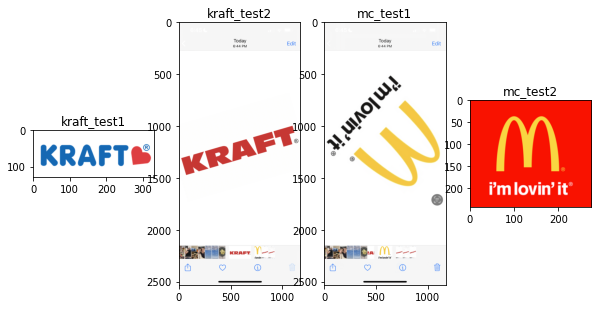

128x128 Images


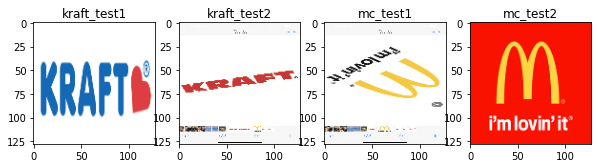

In [88]:
#We will first import the test images and then resize them
kTest1 = cv2.imread(path+'Q1/test/kraft_test1.png') #BGR image
kTest1 = cv2.cvtColor(kTest1, cv2.COLOR_BGR2RGB)

kTest2 = cv2.imread(path+'Q1/test/kraft_test2.PNG') #BGR image
kTest2 = cv2.cvtColor(kTest2, cv2.COLOR_BGR2RGB)

McTest1 = cv2.imread(path+'Q1/test/mc_test2.PNG') #BGR image
McTest1 = cv2.cvtColor(McTest1, cv2.COLOR_BGR2RGB)

McTest2 = cv2.imread(path+'Q1/test/mc_test2.jpeg') #BGR image
McTest2 = cv2.cvtColor(McTest2, cv2.COLOR_BGR2RGB)


#We will plot all images before the 128x128 transformation

print("Original Images")

plt.figure(figsize=(10, 10))

plt.subplot(141), plt.imshow(kTest1)
plt.title("kraft_test1")

plt.subplot(142), plt.imshow(kTest2)
plt.title("kraft_test2")

plt.subplot(143), plt.imshow(McTest1)
plt.title("mc_test1")

plt.subplot(144), plt.imshow(McTest2)
plt.title("mc_test2")


plt.show()

#Resizing the images

#Kraft
kTest1 = cv2.resize(kTest1, (128,128))
kTest2 = cv2.resize(kTest2, (128,128))


#McDonald's
McTest1 = cv2.resize(McTest1, (128,128))
McTest2 = cv2.resize(McTest2, (128,128))


#Plot of the resized images
print("128x128 Images")

plt.figure(figsize=(10, 10))

plt.subplot(141), plt.imshow(kTest1)
plt.title("kraft_test1")
#plt.xticks([]), plt.yticks([]) Removes x/y coords

plt.subplot(142), plt.imshow(kTest2)
plt.title("kraft_test2")

plt.subplot(143), plt.imshow(McTest1)
plt.title("mc_test1")

plt.subplot(144), plt.imshow(McTest2)
plt.title("mc_test2")

plt.show()

#Now we will compute the HoG features
kTest1_features = computeHoGFeatures(kTest1)
kTest2_features = computeHoGFeatures(kTest2)

McTest1_features = computeHoGFeatures(McTest1)
McTest2_features = computeHoGFeatures(McTest2)

Part 1.2.2: Display the HoG features for all test images

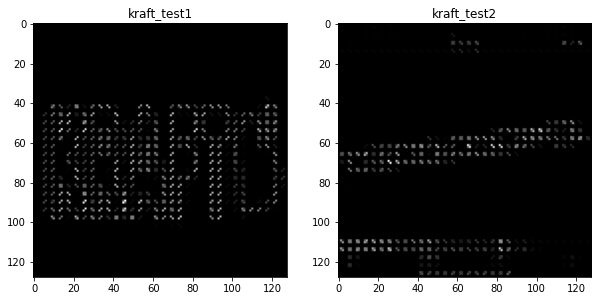

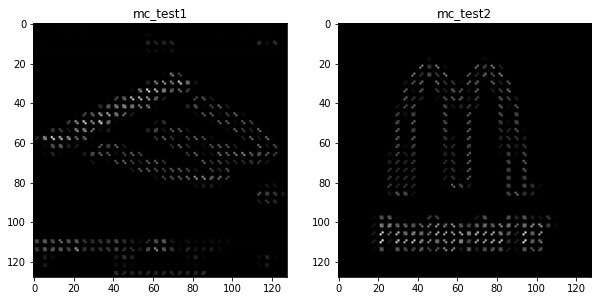

In [89]:
#For this part, we will be using the skimage built in functions as mentioned here: https://mycourses2.mcgill.ca/d2l/le/623649/discussions/threads/1292302/View
#The following link was very useful: https://www.thepythoncode.com/article/hog-feature-extraction-in-python

#Test image 1 and 2
#creating hog features to be displayed
fd, hog_image1 = hog(kTest1, orientations=8, pixels_per_cell=(4, 4),
                	cells_per_block=(4, 4), visualize=True, channel_axis=-1)

fd, hog_image2 = hog(kTest2, orientations=8, pixels_per_cell=(4, 4),
                	cells_per_block=(4, 4), visualize=True,channel_axis=-1)


plt.figure(figsize=(10, 10))

plt.subplot(121), plt.imshow(hog_image1, cmap="gray")
plt.title("kraft_test1")

plt.subplot(122), plt.imshow(hog_image2, cmap="gray")
plt.title("kraft_test2")

plt.show()

#Test image 3 and 4
#creating hog features to be displayed
fd, hog_image3 = hog(McTest1, orientations=8, pixels_per_cell=(4, 4),
                	cells_per_block=(4, 4), visualize=True, channel_axis=-1)

fd, hog_image4 = hog(McTest2, orientations=8, pixels_per_cell=(4, 4),
                	cells_per_block=(4, 4), visualize=True, channel_axis=-1)


plt.figure(figsize=(10, 10))

plt.subplot(121), plt.imshow(hog_image3, cmap="gray")
plt.title("mc_test1")

plt.subplot(122), plt.imshow(hog_image4, cmap="gray")
plt.title("mc_test2")

plt.show()





Part 1.2.3: Classify the test images using the classifier built above

128x128 Images


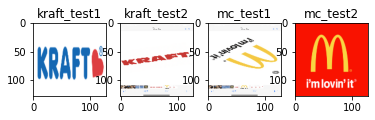

['Kraft' 'Kraft' 'Kraft' 'McDonalds']


In [90]:
#Testing classifer on all 4 test images

#Plot of the resized images
print("128x128 Images")

plt.subplot(141), plt.imshow(kTest1)
plt.title("kraft_test1")
#plt.xticks([]), plt.yticks([]) Removes x/y coords

plt.subplot(142), plt.imshow(kTest2)
plt.title("kraft_test2")

plt.subplot(143), plt.imshow(McTest1)
plt.title("mc_test1")

plt.subplot(144), plt.imshow(McTest2)
plt.title("mc_test2")

plt.show()

"""This cell classifies the test images with the trained classifer"""
hogDescriptorsTest = [kTest1_features, kTest2_features, McTest1_features, McTest2_features]
hogDescriptorsTest = np.asarray(hogDescriptorsTest)
hogDescriptorsTest = hogDescriptorsTest.reshape(hogDescriptorsTest.shape[0], -1)
predictions = classfier.predict(hogDescriptorsTest)
print(predictions)

Part 1.2.4: Does the classifier work on all test images? Discuss which properties of HoG features help to classify the images. Which computer vision methods will you use for classifying logos under rotation.

The classifier does not work on all images, it actually makes a wrong prediction for the mc_test1 McDonald's image while it gets all other images right. Indeed, it can clearly be seen that the classifier using HoG descriptors has difficulty with images that are under heavy rotation, which is to be expected given that HoG features are not rotation invariant, therefore classification errors can be made. 

That being said, the properties of HoG features that help to classify images are plentiful. Firstly, HoG computes magnitude-weighted edge orientation histograms much like SIFT, however, HoG descriptors are computed based on a dense grid of uniformly spaced windows such as cells. We can also decide the number of cells and the cell shapes. Moreover, HoG, compared to SIFT, uses more cells so covers a greater "image patch". Cells are also grouped in descriptor blocks and descriptor blocks may overlap. Additionally, HoG uses gradient directions over gradient magnitudes as gradient magnitude is affected by illumination changes but directions are not. Finally, HoG has no compensation for scale and is therefore much more useful for images that have little change in scale like in surveillance. All the stated reasons above allow HoG features to help classify images.

The computer vision methods that I would use for classifying images or logos under rotation would be to use SIFT as SIFT is geometrically invariant to rotations. So, we would first find the SIFT matches between the original image and a rotated image version of the same image. Then we can match the best  SIFT keypoints that we find given a certain distance threshold. Then we can rotate the rotated image until its keypoints are aligned in a parallel manner with the non-rotated image and then we can apply HoG from there to get accurate classifications.



## Question 2: Image stitching (10 points)




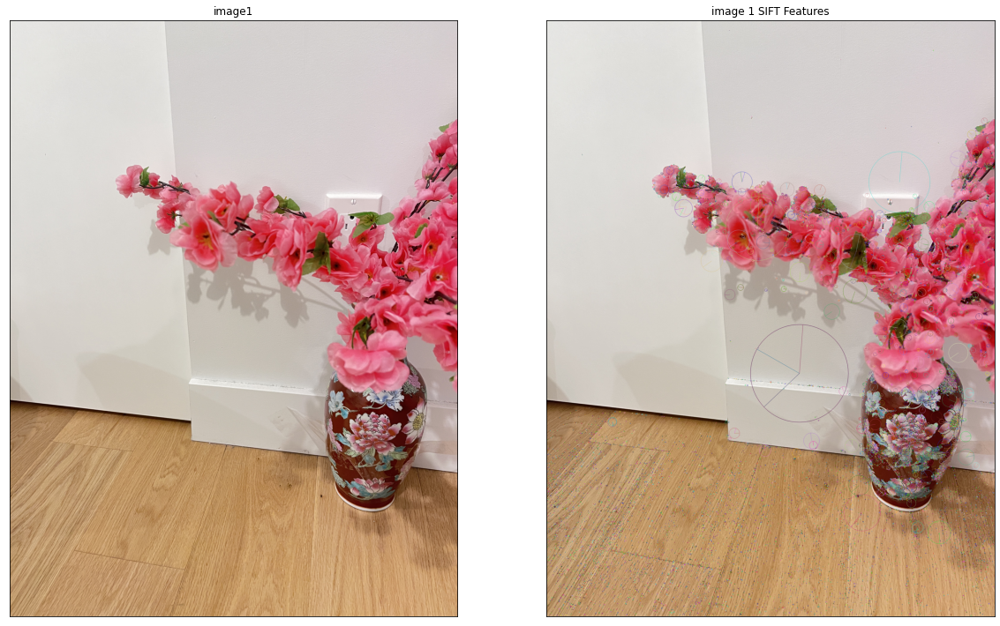

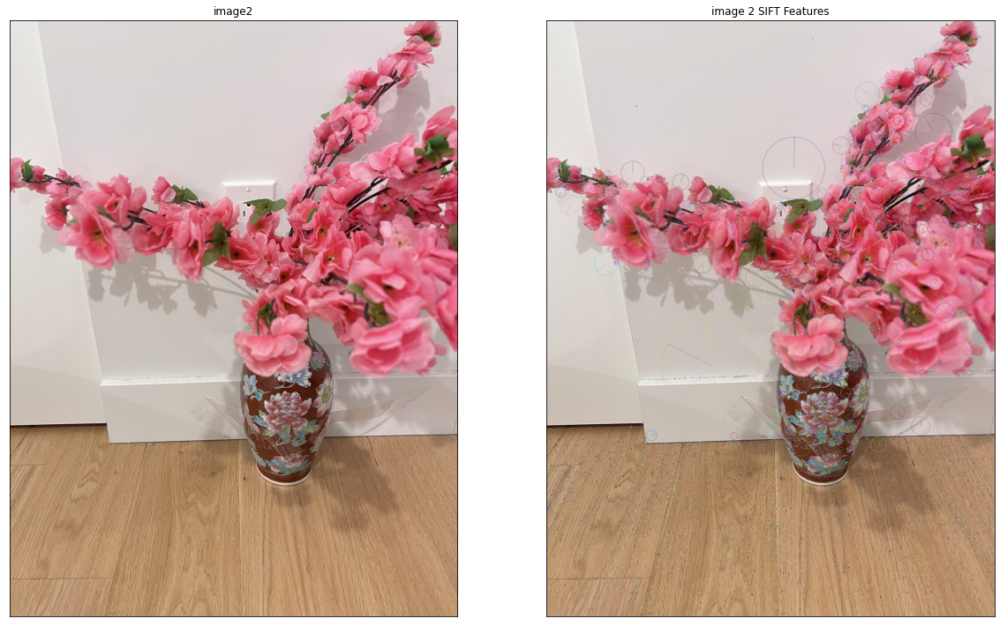

In [91]:
#We will use our knowledge from Assignment 1 and Tutorial 4 to complete all steps for Question 2
#Finally, I also used the following repo as basis for some of the answers in question 2 as well: https://github.com/mattesko (Moresoe for linear blending)

#Step 2.1: Compute the SIFT keypoints and corresponding descriptors for image1 and image 2.

#Import all three images
image1 = cv2.imread(path+'Q2/image1.jpeg') #BGR image
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB) #convert image to colour

image2 = cv2.imread(path+'Q2/image2.jpeg') #BGR image
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB) #convert image to colour

#Creating a SIFT object
sift1 = cv2.xfeatures2d.SIFT_create()
sift2 = cv2.xfeatures2d.SIFT_create()

#Detect SIFT features and descriptors, with no masks
keypoints1, descriptors1 = sift1.detectAndCompute(image1,None)
keypoints2, descriptors2 = sift2.detectAndCompute(image2,None)

#imageCopies
image1Copy = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2Copy = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#Draw the keypoints
cv2.drawKeypoints(image1, keypoints1, image1Copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(image2, keypoints2, image2Copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Display
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image1)
plt.title("image1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image1Copy)
plt.title("image 1 SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image2)
plt.title("image2"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image2Copy)
plt.title("image 2 SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

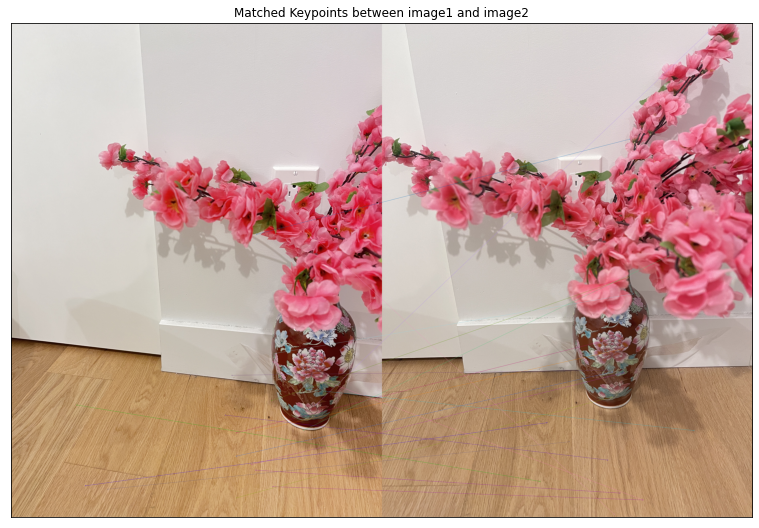

In [92]:
#Step 2.2: Find matching keypoints in image 1 and image 2, and display the 20 best pairs.
# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors2,descriptors1) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints 
imgmatch = cv2.drawMatches(image1,keypoints1,image2,keypoints2, matches[:20], None, flags=2)

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch)
plt.title("Matched Keypoints between image1 and image2"), plt.xticks([]), plt.yticks([])
plt.show()

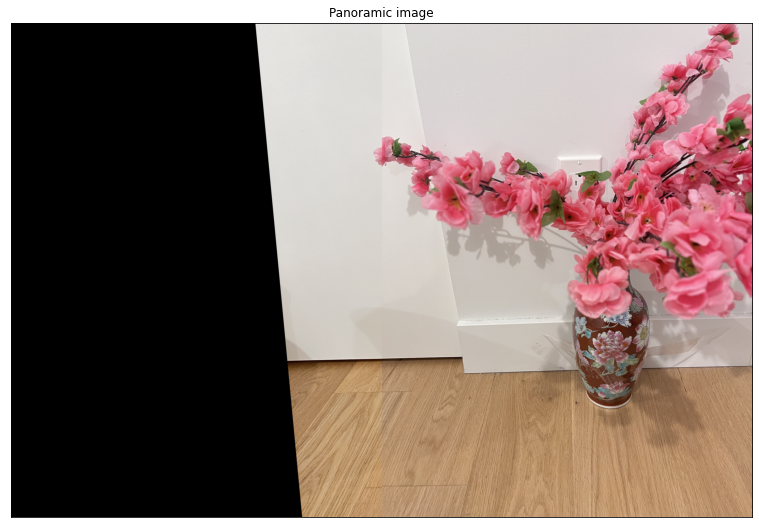

In [93]:
#Step 2.3: Using RANSAC method, find the homography that best describes matches the keypoints, and apply the resulting transformation to image 1. Image 2 should not be transformed.
# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    #if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))

mpr = np.float32([keypoints2[i].pt for (__, i) in GoodMatches])
mpl = np.float32([keypoints1[i].pt for (i, __) in GoodMatches])

# find homography and wrap image accordingly

# cv.FindHomography(srcPoints, dstPoints, H, method=0, ransacReprojThreshold=3.0, status=None)
# Parameters:	
# srcPoints – Coordinates of the points in the original plane, a matrix of the type CV_32FC2 or vector<Point2f> .
# dstPoints – Coordinates of the points in the target plane, a matrix of the type CV_32FC2 or a vector<Point2f> .
# method – Method used to computed a homography matrix. The following methods are possible:
#          0 - a regular method using all the points
#          CV_RANSAC - RANSAC-based robust method
#          CV_LMEDS - Least-Median robust method
# ransacReprojThreshold – Maximum allowed reprojection error to treat a point pair as an inlier (used in the RANSAC method only). That is, if 
#                         | dstPoints_i -  convertPointsHomogeneous( H * srcPoints_i) |  >  ransacReprojThreshold
#                         then the point i is considered an outlier. If srcPoints and dstPoints are measured in pixels, it usually makes sense to set this parameter somewhere in the range of 1 to 10.
# mask – Optional output mask set by a robust method ( CV_RANSAC or CV_LMEDS ). Note that the input mask values are ignored.
# Ref: https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#findhomography
H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)

# Ref: https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87
# dst = cv2.warpPerspective(src, M, dsize, flags, boaderMode, boarderValue)
# src --> input image.
# dst --> output image that has the size dsize and the same type as src .
# M	--> 3×3 transformation matrix.
# dsize --> size of the output image.
# flags --> combination of interpolation methods (INTER_LINEAR or INTER_NEAREST) and the optional flag WARP_INVERSE_MAP, that sets M as the inverse transformation ( dst→src ).
# borderMode --> pixel extrapolation method (BORDER_CONSTANT or BORDER_REPLICATE).
# borderValue --> value used in case of a constant border; by default, it equals 0.

# Shift the right image's x-points because its pixels have to be shifted by image.shape[1] to the right
for i in range(len(mpr)):
    mpr[i][0] += image2.shape[1]

# This adjusts the height
HEIGHT_BUFF = 0

# Used to move the transformed image downwards
M = np.float32([[1,0,0], [0,1,HEIGHT_BUFF], [0,0,1]]) 

# Find homography and apply the warp transform
H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)
wimg = cv2.warpPerspective(image1, M.dot(H), (image2.shape[1] + image1.shape[1], image2.shape[0] + 4 * HEIGHT_BUFF))

# Copy images for Question 2.1.4 - THESE IMAGES WILL BE USED FOR BLENDING IN 2.1.4!
img_left = wimg.copy()
img_right = np.zeros((image2.shape[0] + 4 * HEIGHT_BUFF, image2.shape[1] + image1.shape[1], 3), dtype = np.uint8)

img_right[HEIGHT_BUFF:image2.shape[0] + HEIGHT_BUFF, image1.shape[1]:,:] = image2
wimg[HEIGHT_BUFF:image2.shape[0] + HEIGHT_BUFF, image1.shape[1]:,:] = image2
plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(wimg)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()
#The stiching is the left image towards the right image, we can also do it the other way.

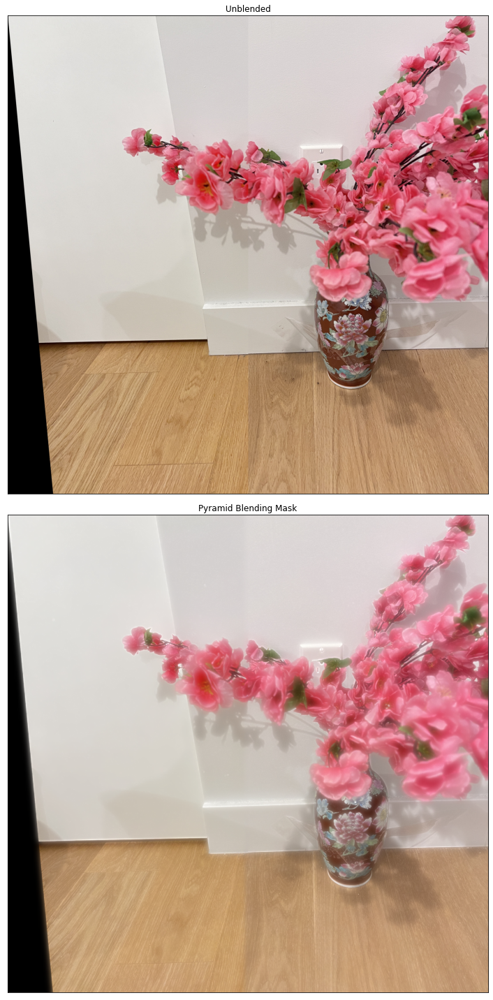

In [94]:
#2.4: Stitch the transformed image 1 and the original image 2 together using pyramid image blending. Let us call it image 12, and display it.
#The answer is inspired based on this documentation: https://docs.opencv.org/4.x/dc/dff/tutorial_py_pyramids.html


def boundingRect(img):
    """Compute and return the up-right bounding rectangle of a point set"""
    grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret,thresholded = cv2.threshold(grayscale, 0, 255,cv2.THRESH_BINARY)
    return cv2.boundingRect(thresholded)

A = img_left
B = img_right

#THE MORE WE INCREASE THE DEPTH, THE MORE BLENDED THE IMAGE WILL BE
DEPTH = 6

#Left clip
xLeft = boundingRect(A)[0]
A = A[:,xLeft:]
B = B[:,xLeft:]

# generate Gaussian pyramid for A
G = A.copy()
gpA = [G]
for i in range(DEPTH):
    G = cv2.pyrDown(G)
    gpA.append(G)

# generate Gaussian pyramid for B
G = B.copy()
gpB = [G]
for i in range(DEPTH):
    G = cv2.pyrDown(G)
    gpB.append(G)

# generate Laplacian Pyramid for A
lpA = [gpA[DEPTH-1]]
for i in range(DEPTH-1,0,-1):
    size = (gpA[i - 1].shape[1], gpA[i - 1].shape[0])
    GE = cv2.pyrUp(gpA[i], dstsize=size)
    L = cv2.subtract(gpA[i-1],GE)
    lpA.append(L)

# generate Laplacian Pyramid for B
lpB = [gpB[DEPTH-1]]
for i in range(DEPTH-1,0,-1):
    size = (gpB[i - 1].shape[1], gpB[i - 1].shape[0])
    GE = cv2.pyrUp(gpB[i], dstsize=size)
    L = cv2.subtract(gpB[i-1],GE)
    lpB.append(L)

# Now add left and right halves of images in each level
LS = []
for la,lb in zip(lpA,lpB):
    rows,cols,dpt = la.shape
    ls = np.hstack((la[:,0:cols//2], lb[:,cols//2:]))
    LS.append(ls)

# now reconstruct
ls_ = LS[0]
for i in range(1,DEPTH):
    size = (LS[i].shape[1], LS[i].shape[0])
    ls_ = cv2.pyrUp(ls_, dstsize=size)
    ls_ = cv2.add(ls_, LS[i])
    

# image with direct connecting each half
real = np.hstack((A[:,:cols//2],B[:,cols//2:]))
image12 = ls_.copy()

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(real)
plt.title("Unblended"), plt.xticks([]), plt.yticks([])
plt.subplot(212)
plt.imshow(image12)
plt.title("Pyramid Blending Mask"), plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()


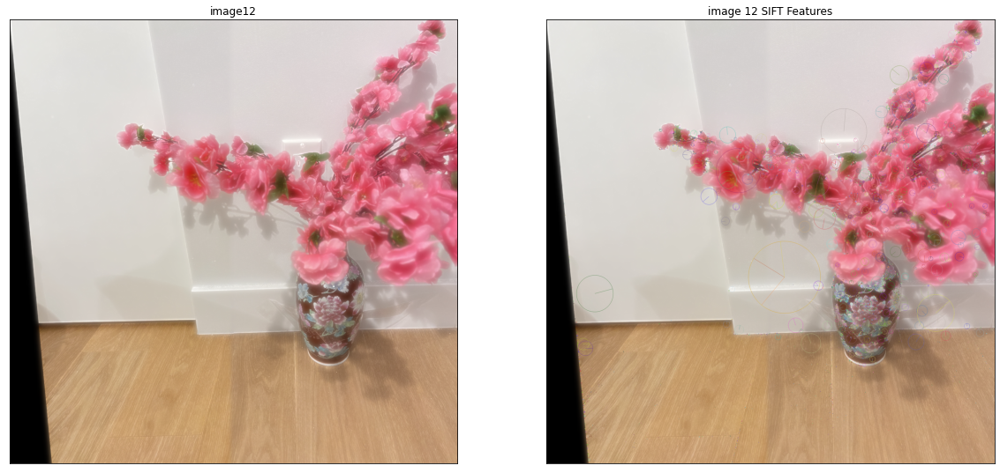

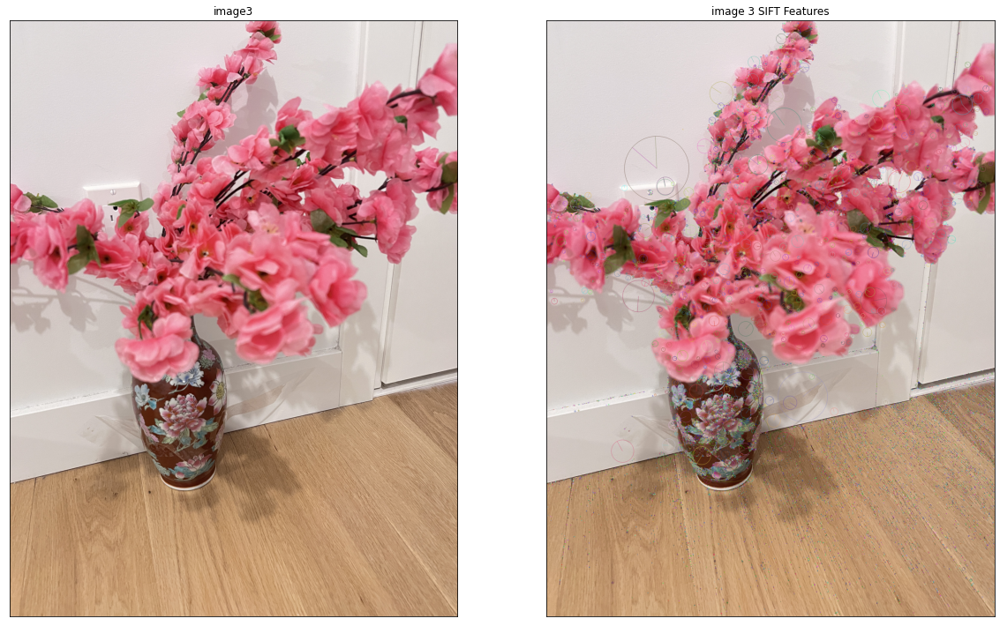

In [95]:
#2.5: Compute the SIFT keypoints and corresponding descriptors for images 12 and 3.

#Load image 3
image3 = cv2.imread(path+'Q2/image3.jpeg') #BGR image
image3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB) #convert image to colour

#Creating a SIFT object
sift12 = cv2.xfeatures2d.SIFT_create()
sift3 = cv2.xfeatures2d.SIFT_create()

#Detect SIFT features and descriptors, with no masks
keypoints12, descriptors12 = sift12.detectAndCompute(image12,None)
keypoints3, descriptors3 = sift3.detectAndCompute(image3,None)

#imageCopies
image12Copy = cv2.cvtColor(image12, cv2.COLOR_BGR2RGB)
image3Copy = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)

#Draw the keypoints
cv2.drawKeypoints(image12, keypoints12, image12Copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(image3, keypoints3, image3Copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Display
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image12)
plt.title("image12"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image12Copy)
plt.title("image 12 SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image3)
plt.title("image3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image3Copy)
plt.title("image 3 SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

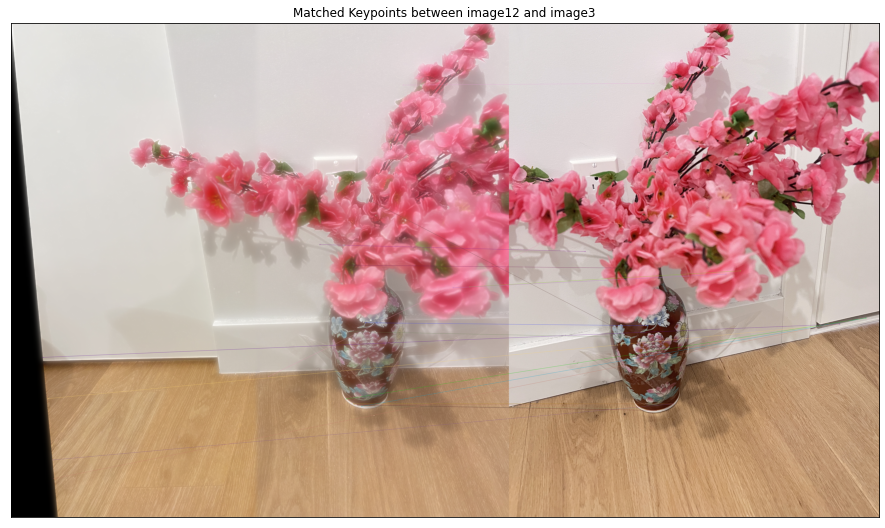

In [96]:
#2.6: Find matching keypoints in image 12 and image 3, and display the 20 best pairs.
# create BFMatcher object
bf26 = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors12,descriptors3) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints 
imgmatch12 = cv2.drawMatches(image12,keypoints12,image3,keypoints3, matches[:20], None, flags=2)

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch12)
plt.title("Matched Keypoints between image12 and image3"), plt.xticks([]), plt.yticks([])
plt.show()


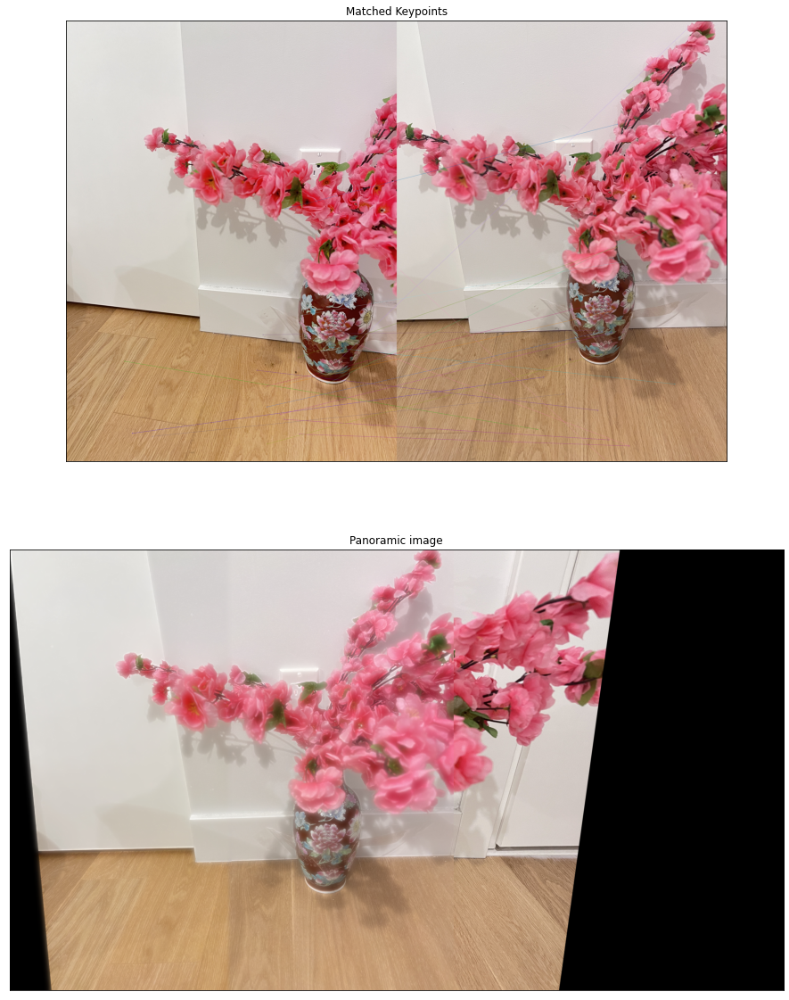

In [97]:
#2.7: Find the homography using the RANSAC method, and apply the resulting transformation to image 3. Image 12 should not be transformed.
# Arrange matching keypoints in two separate lists
imgl = image12
imgr = image3

# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    #if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))

mpr = np.float32([keypoints3[i].pt for (i, __) in GoodMatches])
mpl = np.float32([keypoints12[i].pt for (__, i) in GoodMatches])

# find homography and wrap image accordingly

# cv.FindHomography(srcPoints, dstPoints, H, method=0, ransacReprojThreshold=3.0, status=None)
# Parameters:	
# srcPoints – Coordinates of the points in the original plane, a matrix of the type CV_32FC2 or vector<Point2f> .
# dstPoints – Coordinates of the points in the target plane, a matrix of the type CV_32FC2 or a vector<Point2f> .
# method – Method used to computed a homography matrix. The following methods are possible:
#          0 - a regular method using all the points
#          CV_RANSAC - RANSAC-based robust method
#          CV_LMEDS - Least-Median robust method
# ransacReprojThreshold – Maximum allowed reprojection error to treat a point pair as an inlier (used in the RANSAC method only). That is, if 
#                         | dstPoints_i -  convertPointsHomogeneous( H * srcPoints_i) |  >  ransacReprojThreshold
#                         then the point i is considered an outlier. If srcPoints and dstPoints are measured in pixels, it usually makes sense to set this parameter somewhere in the range of 1 to 10.
# mask – Optional output mask set by a robust method ( CV_RANSAC or CV_LMEDS ). Note that the input mask values are ignored.
# Ref: https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#findhomography
H, __ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)

# Ref: https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87
# dst = cv2.warpPerspective(src, M, dsize, flags, boaderMode, boarderValue)
# src --> input image.
# dst --> output image that has the size dsize and the same type as src .
# M	--> 3×3 transformation matrix.
# dsize --> size of the output image.
# flags --> combination of interpolation methods (INTER_LINEAR or INTER_NEAREST) and the optional flag WARP_INVERSE_MAP, that sets M as the inverse transformation ( dst→src ).
# borderMode --> pixel extrapolation method (BORDER_CONSTANT or BORDER_REPLICATE).
# borderValue --> value used in case of a constant border; by default, it equals 0.
wimg = cv2.warpPerspective(imgr, H, (imgr.shape[1]+imgl.shape[1],imgr.shape[0]))
wimg[:,:imgl.shape[1],:] = imgl

# This saves the images for use in later cells
img_right28 = wimg.copy()
img_left28 = np.zeros((imgl.shape[0] + HEIGHT_BUFF, imgl.shape[1] + imgr.shape[1], 3), dtype=np.uint8)


image123 = wimg.copy()

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.subplot(212)
plt.imshow(image123)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()

#The stiching is the left image towards the right image, we can also do it the other way.
# #The stiching is the left image towards the right image, we can also do it the other way.



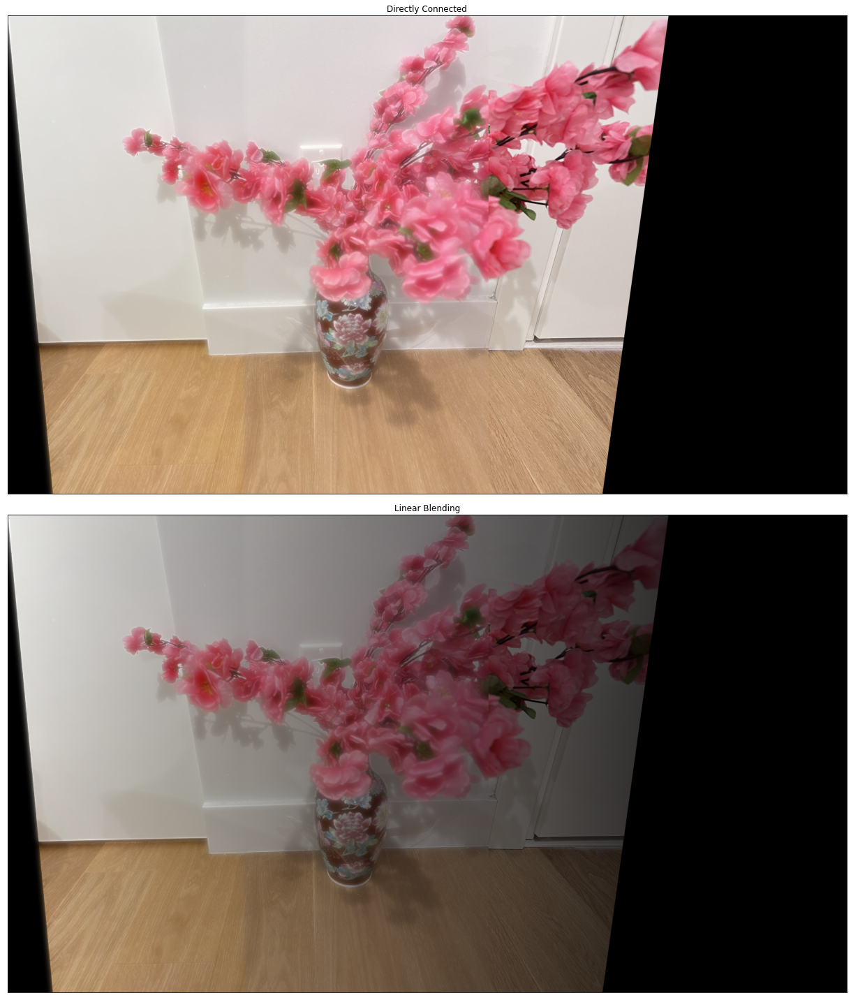

In [98]:
#2.8: Stitch the transformed image 3 and image 12 together using linear image blending. Display the resulting image. 
#The following code for linear blending is inspired from the following link: https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html

image_B = img_left28.copy()
image_A = img_right28.copy()

# Determine height, width
height, width = image_A.shape[0:2]
# image with direct connecting each half
#real = np.hstack((image_A[:, :round(height / 2)], image_B[:, round(height / 2):]))

# Linear Blending
# i_width: img width
# r_width: ramp width
# r_index: center ramp index
# start: starting ramp value
# end: ending ramp value
def Ramp(i_width, r_width, r_index, start, end):

    a = np.zeros((i_width))
    step = (end - start) / (r_width-1)
    idx = round(r_index - (r_width / 2))  # left side starting index of alpha ramp
    for i in range(r_width):
        a[idx] = start + step*i
        idx += 1
    a[idx:] = 1
    return a

# Alpha blending ramp
RAMP_SIZE = 7082
alpha = Ramp(image_A.shape[1], RAMP_SIZE, round(image_A.shape[1] / 2), 0, 1)


# Now blend
I_blend = (1 - alpha.reshape(1, -1, 1)) * image_A + alpha.reshape(1, -1, 1) * image_B
I_blend = np.uint8(I_blend)

plt.figure(figsize=(20, 20))
plt.subplot(211), plt.imshow(wimg)
plt.title("Directly Connected"), plt.xticks([]), plt.yticks([])
plt.subplot(212), plt.imshow(I_blend)
plt.title("Linear Blending"), plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()




Part 2.9: Discuss which method you prefer for stitching - pyramid blending or linear blending, and why?

Both are useful type of stitchings. Indeed, pyramid blending is much more useful when wanting to smoothly blend two "borders" between two images. It allows us to do the blend much more smoothly and there is very little ghosting between the images that we are blending. Pyramid blending is however much more computationally expensive given that we must calculate gaussian and laplacian pyramids multiple times. On the other hand, linear blending is much less computationally expensive. However, it is a very simple type of blending and ghosting between images can be very noticeable, so it isn't always the best option.

For question 2, pyramid blending is prefered over linear blending in my opinion given that all three images are quite similar. Furthermore, using pyramid blending can allow us to smooth the "borders" between all images well since the images are so similar and it can also allow us to have a much better panoramic image without any ghosting effects which linear blending would have created.

# Question 3: Face detection (10 points)

Question 3.1: Eigenface representation

Part 3.1.1

(Text(0.5, 1.0, 'Mean Face'), ([], []), ([], []))

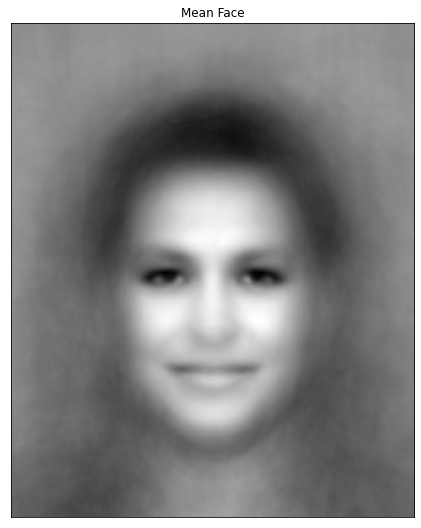

In [99]:
#Part 3.1.1: Display the mean face of the dataset
#Answers for both questions 3.1 and 3.2 were inspired by Tutorial 5 as well as the following links: 
# https://towardsdatascience.com/viola-jones-algorithm-and-haar-cascade-classifier-ee3bfb19f7d8
# https://laid.delanover.com/explanation-face-recognition-using-eigenfaces/

DIRECTORY = '/content/drive/MyDrive/ECSE_415/Assignments/A2/Assignment2_Data/Q3/drive-download-20230205T204823Z-001/'
images = os.listdir(DIRECTORY)

dataset = []
flattenedDataset = []


# Import and resize images
for i in range(0, len(images)):
    name = images[i]
    if name == ".DS_Store":
      continue
    image = cv2.imread(DIRECTORY + name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Convert image to colour
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #Convert image to gray
    dataset.append(image)
    flattenedImage = image.flatten()
    flattenedDataset.append(flattenedImage)

flattenedDataset = np.asarray(flattenedDataset)

#Sum all images together
sumOfAllFaces = np.zeros((218,178))

for i in range(0, len(images)):
    name = images[i]
    if name == ".DS_Store":
      continue
    image = cv2.imread(DIRECTORY + name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Convert image to colour
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #Convert image to gray
    sumOfAllFaces = sumOfAllFaces + image

#Mean Face
meanFace = np.divide(sumOfAllFaces, 400)

plt.figure(figsize=(20, 20))
plt.subplot(211), plt.imshow(meanFace, cmap="gray")
plt.title("Mean Face"), plt.xticks([]), plt.yticks([])

In [100]:
#3.2: Find corresponding eigenvectors and eigenvalues, and sort in descending order.

#Get D array
D = np.mean(dataset, axis=0)

#Calculate 
DDT = D @ D.T
EVas, vectors = sp.linalg.eigh(DDT)

#Sort these values in descending order

#3.3: Print out the first 4 eigenvalues.
EVas = np.sort(EVas)[::-1]
print(EVas[0])
print(EVas[1])
print(EVas[2])
print(EVas[3])

515486019.82786846
6221474.17059094
1180282.494422673
420205.2764169


(38804, 400) (38804, 1)
Reconstruction error with k=5: 12227.88136913104


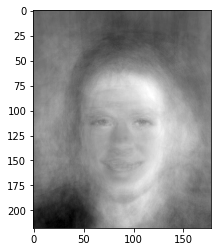

(38804, 400) (38804, 1)
Reconstruction error with k=10: 8665.5182352586


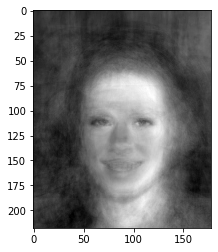

(38804, 400) (38804, 1)
Reconstruction error with k=20: 7091.150237402666


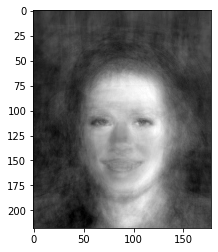

(38804, 400) (38804, 1)
Reconstruction error with k=400: 1286.6711600912458


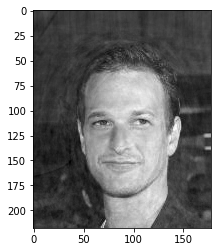

In [101]:
#3.4: Let k be the first k eigenvectors. Try k = 20, 10, 5, and report the reconstruction error in each case.
def project(Q, X):
    return np.dot(Q.T, X)


#Source: https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8
def pca(X, k, D):

    X_cp = X
    x_centered = X_cp - D
    print(x_centered.shape, D.shape)

    # Compute svd
    u, s, vh = np.linalg.svd(x_centered, full_matrices=False)

    u_truncated = np.resize(u, (X_cp.shape[0], k))
    u_truncated = u[:X_cp.shape[0], :k]

    Z = project(u_truncated, X_cp)

    return Z, u_truncated

fDT = flattenedDataset.T 
k1 = 5
k2 = 10
k3 = 20

#k = 5
Z, Q = pca(fDT[:, :], k1, D.flatten().reshape(-1, 1))
originals = Q @ Z
print(
        f"Reconstruction error with k={k1}: {np.mean(np.linalg.norm(originals - fDT, axis=0))}")
plt.imshow(originals[:, 0].reshape(218,178), "gray")
plt.show()

#k = 10
Z, Q = pca(fDT[:, :], k2, D.flatten().reshape(-1, 1))
originals = Q @ Z
print(
        f"Reconstruction error with k={k2}: {np.mean(np.linalg.norm(originals - fDT, axis=0))}")
plt.imshow(originals[:, 0].reshape(218,178), "gray")
plt.show()

#k = 20
Z, Q = pca(fDT[:, :], k3, D.flatten().reshape(-1, 1))
originals = Q @ Z
print(
        f"Reconstruction error with k={k3}: {np.mean(np.linalg.norm(originals - fDT, axis=0))}")
plt.imshow(originals[:, 0].reshape(218,178), "gray")
plt.show()

#k = 400
Z, Q = pca(fDT[:, :], 400, D.flatten().reshape(-1, 1))
originals = Q @ Z
print(
        f"Reconstruction error with k={400}: {np.mean(np.linalg.norm(originals - fDT, axis=0))}")
plt.imshow(originals[:, 0].reshape(218,178), "gray")
plt.show()



Question 3.2: Face detection

Part 3.2.1

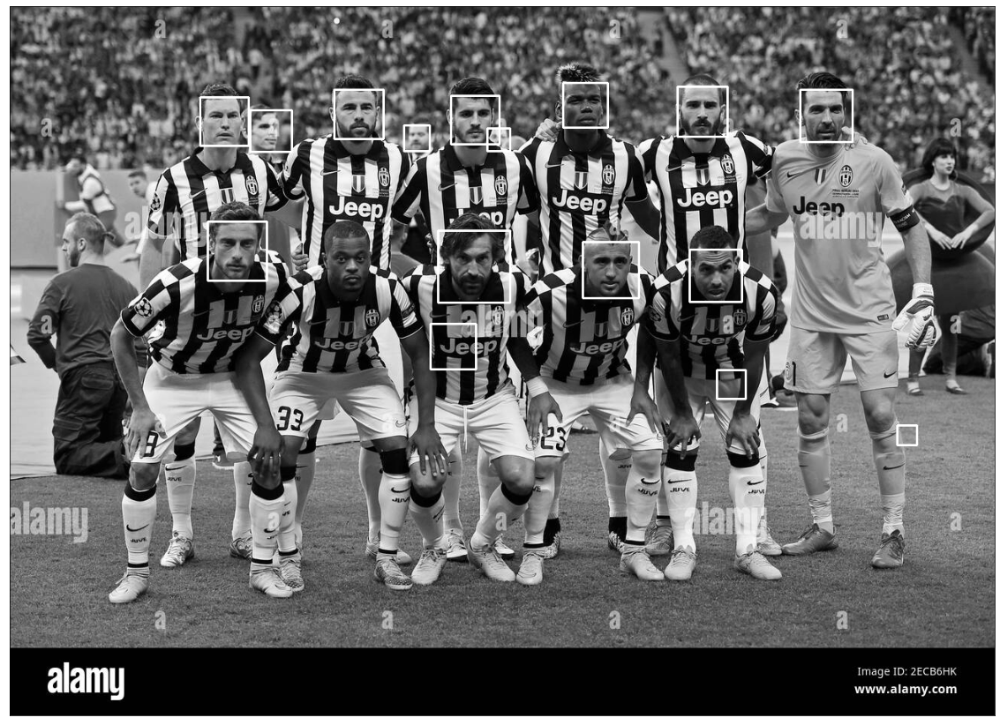

In [103]:
#The following is based off of Tutorial 5 and this post https://mycourses2.mcgill.ca/d2l/le/623649/discussions/threads/1293559/View

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_frontalface_default.xml')

img = cv2.imread(path+'Q3/Juventus.jpeg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# detecMutliScale
#   Params: image – Matrix of the type CV_8U containing an image where objects are detected.
#           scaleFactor (1.1) – Parameter specifying how much the image size is reduced at each image scale.
#           minNeighbors (3) – Parameter specifying how many neighbors each candidate rectangle should have to retain it.
#           minSize (0,0) – Minimum possible object size. Objects smaller than that are ignored.
#           maxSize (0,0) – Maximum possible object size. Objects larger than that are ignored.

faces = face_cascade.detectMultiScale(gray, 1.1, 2)

for (x,y,w,h) in faces:
    gray = cv2.rectangle(gray,(x,y),(x+w,y+h),(255,0,0),2)


plt.figure(figsize=(20, 20))
plt.imshow(gray, cmap="gray")
plt.xticks(())
plt.yticks(())
plt.show()

Part 3.2.2: Describe how well the method works

Generally speaking, the method works quite well, however, it also encounters some issues. Indeed, we can clearly see that it detects faces that are not faces. It also misses a few faces from darker skin complexions. All in all, it works at a decent level, but can be better.